In [1]:
import turtle

Saved design to koch_fractal_tshirt_design.png


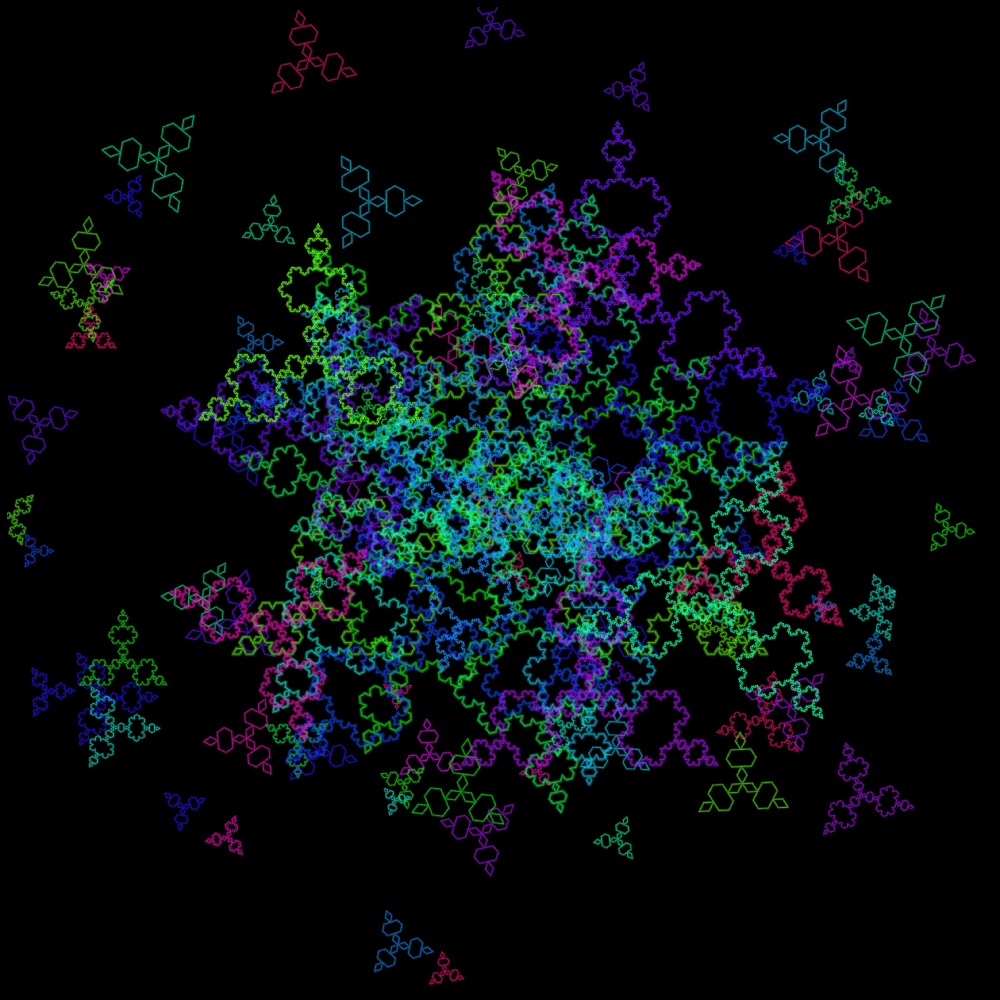

In [2]:
"""
Koch Snowflake Fractal T-Shirt Design Generator
------------------------------------------------
Generates a dense, colorful, glowing Koch-snowflake fractal pattern
(inspired by psychedelic neon fractal t-shirt designs) and exports
it as a high-resolution PNG suitable for print-on-demand t-shirts.

No turtle module is used here -- points are generated mathematically
with numpy/recursion so we can push to high recursion depth quickly
and render with matplotlib for full control over color, glow, and
high-DPI PNG export.
"""

import numpy as np
import matplotlib.pyplot as plt
import colorsys
import random

# ----------------------------------------------------------------------
# 1. Koch curve point generation (vectorized-ish recursion)
# ----------------------------------------------------------------------

def koch_curve(p1, p2, depth):
    """Recursively return list of points for a single Koch curve segment."""
    if depth == 0:
        return [p1, p2]

    p1 = np.array(p1, dtype=float)
    p2 = np.array(p2, dtype=float)
    delta = (p2 - p1) / 3
    a = p1 + delta
    b = p1 + 2 * delta

    angle = np.pi / 3
    rot = np.array([[np.cos(angle), -np.sin(angle)],
                     [np.sin(angle),  np.cos(angle)]])
    peak = a + rot.dot(delta)

    pts = []
    pts += koch_curve(p1, a, depth - 1)[:-1]
    pts += koch_curve(a, peak, depth - 1)[:-1]
    pts += koch_curve(peak, b, depth - 1)[:-1]
    pts += koch_curve(b, p2, depth - 1)
    return pts


def koch_snowflake(depth, size=1.0, center=(0, 0)):
    """Return points for a full closed Koch snowflake (triangle base)."""
    cx, cy = center
    h = size * np.sqrt(3) / 2
    p1 = (cx - size / 2, cy - h / 3)
    p2 = (cx + size / 2, cy - h / 3)
    p3 = (cx, cy + 2 * h / 3)

    pts = []
    pts += koch_curve(p1, p2, depth)[:-1]
    pts += koch_curve(p2, p3, depth)[:-1]
    pts += koch_curve(p3, p1, depth)
    return np.array(pts)


def rotate(points, angle_deg, center=(0, 0)):
    """Rotate a set of points around a center by angle_deg degrees."""
    angle = np.radians(angle_deg)
    c, s = np.cos(angle), np.sin(angle)
    R = np.array([[c, -s], [s, c]])
    cx, cy = center
    shifted = points - np.array([cx, cy])
    rotated = shifted @ R.T
    return rotated + np.array([cx, cy])


# ----------------------------------------------------------------------
# 2. Color helpers -- neon gradient palette like the reference design
# ----------------------------------------------------------------------

def neon_palette(n, hue_start=0.28, hue_span=0.65, sat=0.9, val=1.0):
    """Generate n neon RGB colors sweeping through green/blue/purple/pink."""
    colors = []
    for i in range(n):
        hue = (hue_start + (i / max(n - 1, 1)) * hue_span) % 1.0
        r, g, b = colorsys.hsv_to_rgb(hue, sat, val)
        colors.append((r, g, b))
    return colors


# ----------------------------------------------------------------------
# 3. Build the layered fractal design
# ----------------------------------------------------------------------

def build_design(fig_size=14, dpi=300, base_depth=4, layers=14,
                  seed=7, glow_passes=5, view_radius=2.4):
    random.seed(seed)
    np.random.seed(seed)

    fig, ax = plt.subplots(figsize=(fig_size, fig_size), dpi=dpi)
    fig.patch.set_facecolor('black')
    ax.set_facecolor('black')

    colors = neon_palette(layers)

    def draw(pts, color, base_lw, base_alpha):
        """Draw with an additive-looking glow: wide+faint under thin+bright."""
        for g in range(glow_passes):
            frac = g / (glow_passes - 1)
            lw = base_lw * (1.0 - 0.75 * frac) + base_lw * 2.2 * (1 - frac)
            alpha = base_alpha * (0.10 + 0.55 * frac)
            ax.plot(pts[:, 0], pts[:, 1], color=color,
                    linewidth=lw, alpha=min(alpha, 1.0),
                    solid_capstyle='round', solid_joinstyle='round')

    # Layer 1: dense field of small rotated/scaled snowflakes packed
    # tightly around the center (the fine lace texture in the reference)
    n_small = layers * 6
    for i in range(n_small):
        depth = random.choice([2, 2, 3])
        size = random.uniform(0.12, 0.5)
        angle = random.uniform(0, 360)
        # bias positions toward center using a radius^0.6 falloff so it's
        # dense in the middle and thins toward the edges
        r = (random.random() ** 0.6) * view_radius
        theta = random.uniform(0, 2 * np.pi)
        cx, cy = r * np.cos(theta), r * np.sin(theta)
        pts = koch_snowflake(depth, size=size, center=(0, 0))
        pts = rotate(pts, angle, center=(0, 0)) + np.array([cx, cy])
        color = random.choice(colors)
        draw(pts, color, base_lw=1.1, base_alpha=0.5)

    # Layer 2: mid-size rotated snowflakes forming swirling structure
    for i in range(layers):
        depth = base_depth
        size = 2.6 - i * (1.9 / layers)
        angle = i * (360 / layers) * 1.4
        r = (i / layers) * view_radius * 0.6
        theta = i * 2.4
        pts = koch_snowflake(depth, size=size, center=(0, 0))
        pts = rotate(pts, angle, center=(0, 0))
        pts = pts + np.array([r * np.cos(theta), r * np.sin(theta)])
        color = colors[i]
        draw(pts, color, base_lw=1.6, base_alpha=0.55)

    # Layer 3: a handful of high-detail "hero" snowflakes for crisp fine
    # lace detail and focal spiral points, like the reference image
    hero_positions = [(-0.9, 0.7), (1.1, -0.5), (0.0, -0.1), (0.6, 1.0)]
    for i, center in enumerate(hero_positions):
        depth = base_depth + 1  # extra recursion = finer lace detail
        size = random.uniform(0.8, 1.5)
        angle = random.uniform(0, 360)
        pts = koch_snowflake(depth, size=size, center=(0, 0))
        pts = rotate(pts, angle, center=(0, 0)) + np.array(center)
        color = colors[(i * 3) % len(colors)]
        draw(pts, color, base_lw=1.0, base_alpha=0.75)

    ax.set_xlim(-view_radius, view_radius)
    ax.set_ylim(-view_radius, view_radius)
    ax.set_aspect('equal')
    ax.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

    return fig


if __name__ == "__main__":
    fig = build_design(
        fig_size=14,       # inches -- larger = more resolution at same dpi
        dpi=300,           # print quality (300 DPI is standard for apparel)
        base_depth=4,      # Koch recursion depth for main snowflakes
        layers=14,         # number of mid-size layered snowflakes
        seed=3,            # change this for a different random layout
        glow_passes=5,     # more passes = softer glow, slower render
        view_radius=2.4    # smaller = tighter/denser composition
    )

    output_path = "koch_fractal_tshirt_design.png"
    fig.savefig(output_path, facecolor='black', dpi=300)
    print(f"Saved design to {output_path}")

In [2]:
help(turtle)

Help on module turtle:

NAME
    turtle

MODULE REFERENCE
    https://docs.python.org/3.14/library/turtle#module-turtle

    The following documentation is automatically generated from the Python
    source files.  It may be incomplete, incorrect or include features that
    are considered implementation detail and may vary between Python
    implementations.  When in doubt, consult the module reference at the
    location listed above.

DESCRIPTION
    Turtle graphics is a popular way for introducing programming to
    kids. It was part of the original Logo programming language developed
    by Wally Feurzig and Seymour Papert in 1966.

    Imagine a robotic turtle starting at (0, 0) in the x-y plane. After an ``import turtle``, give it
    the command turtle.forward(15), and it moves (on-screen!) 15 pixels in
    the direction it is facing, drawing a line as it moves. Give it the
    command turtle.right(25), and it rotates in-place 25 degrees clockwise.

    By combining together th